##### Copyright 2025 Google LLC.

In [ ]:
# @title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Generative designs with Gemini and Imagen 3

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/examples/Generative_Designs.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
</table>

In this notebook, you will be able to use both Imagen 3 and Gemini to generate patterns and designs based on sample data that you upload. In this particular example, you will be able to generate beautiful designs based on art from the beams of Chinese Temples that have been pre-uploaded.

The goal is a playful way to use your own photos, images, designs, artwork or any other "sample data" to generate multiple, new and creative images to inspire a design or art project. It is also a demonstration of the powerful collaboration between Gemini and Imagen in being able to generate new images based on both sample data and sepcific prompts.

*Disclaimer: At this time, Imagen 3 is only avaible as a paid feature*.

## Setup

Install the Gemini API Python SDK:

In [ ]:
%pip install -U -q "google-genai>=1.0.0"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.7/137.7 kB 5.5 MB/s eta 0:00:00


In [ ]:
from google import genai
from google.genai import types

### Setup your API key

To run the following cell, your API key must be stored it in a Colab Secret named `GOOGLE_API_KEY`. If you don't already have an API key, or you're not sure how to create a Colab Secret, see [Authentication](../quickstarts/Authentication.ipynb) for an example.

In [ ]:
from google.colab import userdata

GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
client = genai.Client(api_key=GOOGLE_API_KEY)

## Download the data

In this example, you will download pictures of intricate designs on beams of Chinese temples that have already been embeded/preuploaded into this colab. The goal, as you continue to explore, is for you to upload your own sample data to generate the deisgns that you want.

In [ ]:
# Unzip the files
URL = "https://storage.googleapis.com/generativeai-downloads/data/generative_designs.zip" # @param {type: "string"}
!wget {URL} -q -O generative_designs.zip
!unzip -q -o generative_designs.zip

Here's what the sample looks like:<img src="https://storage.googleapis.com/generativeai-downloads/images/generativeIdeas.png">

## Generate Designs

Start by uploading each of your images to the File API:

In [ ]:
import pathlib

# Upload each of the image files to the File API
idx = 0
image_files = []
for image in pathlib.Path('generative_designs').iterdir():
  image_file = client.files.upload(
    file=image,
    config=types.FileDict(display_name=f'image {idx}')
  )
  idx += 1
  image_files.append(image_file)
  print(f"Uploaded file '{image_file.display_name}' as: {image_file.uri}")

Uploaded file 'image 0' as: https://generativelanguage.googleapis.com/v1beta/files/7cxpylrtxo4k
Uploaded file 'image 1' as: https://generativelanguage.googleapis.com/v1beta/files/ulgm125ftj0v
Uploaded file 'image 2' as: https://generativelanguage.googleapis.com/v1beta/files/3uaas4qxbmw6
Uploaded file 'image 3' as: https://generativelanguage.googleapis.com/v1beta/files/udetz8y4rh0y
Uploaded file 'image 4' as: https://generativelanguage.googleapis.com/v1beta/files/7v3oajx8phpy
Uploaded file 'image 5' as: https://generativelanguage.googleapis.com/v1beta/files/pjhcsug3rueq
Uploaded file 'image 6' as: https://generativelanguage.googleapis.com/v1beta/files/xu30w74ha0nz
Uploaded file 'image 7' as: https://generativelanguage.googleapis.com/v1beta/files/6but0ya3xdkd
Uploaded file 'image 8' as: https://generativelanguage.googleapis.com/v1beta/files/llyfp8phcn8o
Uploaded file 'image 9' as: https://generativelanguage.googleapis.com/v1beta/files/miisyh41za6k
Uploaded file 'image 10' as: https://gen

Let's start by generating a prompt initially. The goal is to generate a prompt that will be passed to the image generation model to complete a certain task. Pass in this prompt and the image files created to the `get_image_prompt` function. Since this is a creative notebook, set the temperature to 2.0 for maximum creative output.

In [ ]:
prompt_generation_prompt = f"""
  Hi, I have these three images and I want to generate more images like them. I'm not interested
  in the temple architecture, just the patterns on the beams themselves.
  I want abstract, geometric repeating patterns.
  Use the thangka painting style.

  I have an image generation tool that takes an english prompt,
  can you write a prompt for me?

  The prompt can be up to 400 tokens.

  Just return the prompt, no other text, this is really important as I'm going to paste it directly into the image generator.
"""

In [ ]:
def get_image_prompt(prompt, image_files):
  response = client.models.generate_content(
      model="gemini-2.0-flash-exp",
      contents=[prompt]+image_files,
      #config=dict(temperature=2.0)
      )
  return response.text


In [ ]:
get_image_prompt(prompt_generation_prompt, image_files)

'Abstract geometric patterns, thangka painting style, repeating, vibrant colors, intricate details, symmetrical design, complex, stylized, high contrast, fine lines, ornamental, cultural, traditional Tibetan art, temple beam patterns, mandalas, sanskrit script, stylized clouds, lotus flowers, auspicious symbols, interlocking shapes, geometric abstraction, no temple architecture, sharp focus, vibrant, colorful, ornate, decorative, detailed, clean lines, visually striking, symmetrical, balanced composition, traditional color palette: reds, blues, greens, yellows, golds, strong outlines.\n'

Let's use this prompt to generate the images that you desire.

In [ ]:
def generate_images(prompt):
  result = client.models.generate_images(
      model="imagen-3.0-generate-002",
      prompt=prompt,
      config=dict(
        number_of_images=1, # default is 4, valid value is 1-4
        aspect_ratio="4:3"  # default is 1:1, supported values are 1:1, 3:4, 4:3, 16:9, 9:16)
      )
  )
  return result

Now, generate a bunch of prompts, turn each one into an image, and save the images.

Thangka painting, abstract geometric repeating patterns inspired by beam decorations, intricate details, vibrant colors of red, blue, green, and gold, symmetrical composition, stylized elements, traditional Tibetan art motifs, detailed linework, ornate patterns, geometric shapes, high resolution, fine art, crisp details, no temple, no architecture, just the patterns.


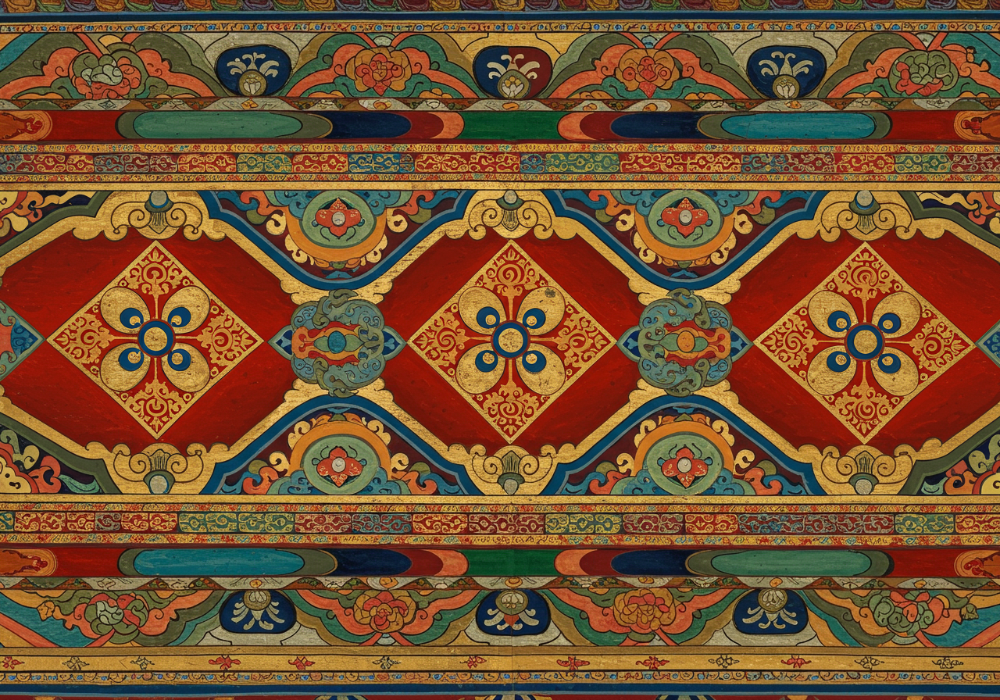

Abstract geometric repeating patterns in the style of Thangka paintings. Inspired by traditional Chinese architectural beam decorations, focus on bold, vibrant colors and intricate details. Use a color palette of reds, blues, greens, and yellows, common in Thangka art. Incorporate geometric shapes like circles, squares, triangles, and interlocking patterns. The composition should feel balanced and harmonious, adhering to Thangka principles of symmetry and proportion. Avoid realistic depictions; aim for stylized and symbolic representations. The patterns should be dense and complex, filling the entire space with eye-catching detail. Consider adding subtle gradients or shading to enhance the depth and texture of the patterns. The overall aesthetic should be rich, decorative, and visually captivating. No temple architecture.


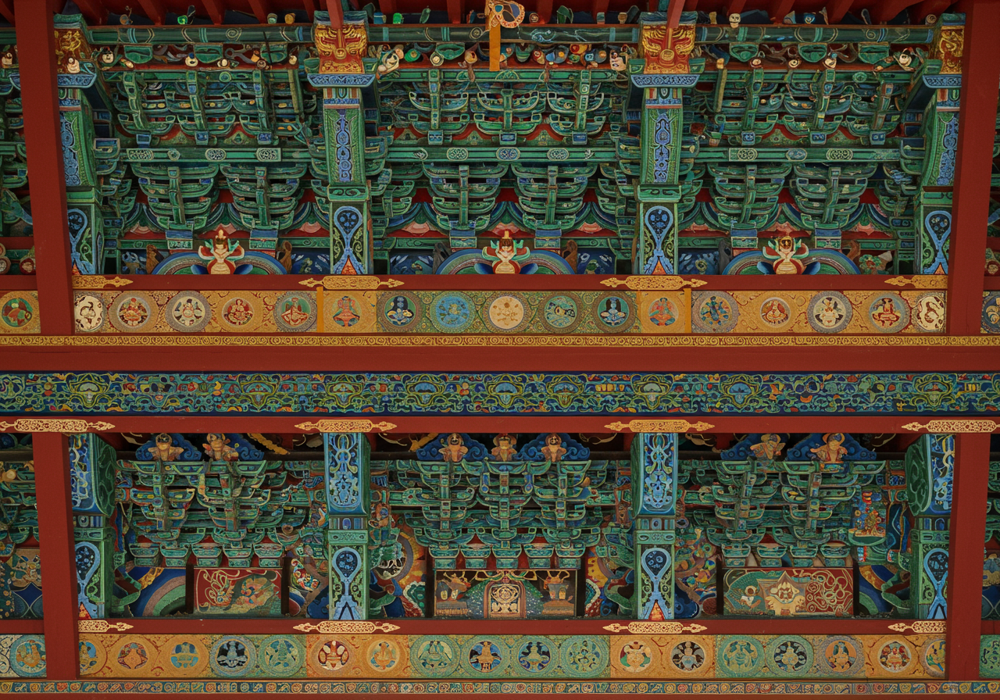

Abstract geometric repeating patterns, thangka painting style. Intricate designs, symmetrical compositions. Bold colors: reds, blues, greens, golds, and whites. Focus on interlocking shapes, spirals, mandalas, and stylized clouds. No temple architecture or representational imagery. Highly detailed, ornate, and visually complex patterns suitable for beams. Incorporate elements reminiscent of Tibetan Buddhist art. Precision and clarity in the line work. Avoid photorealism, emphasize artistic interpretation. Stylized flowers and cloud motifs. The painting should evoke a sense of spirituality and harmony. Geometricized floral patterns, complex circular designs, interlocking key patterns, symmetrical and asymmetrical balance.


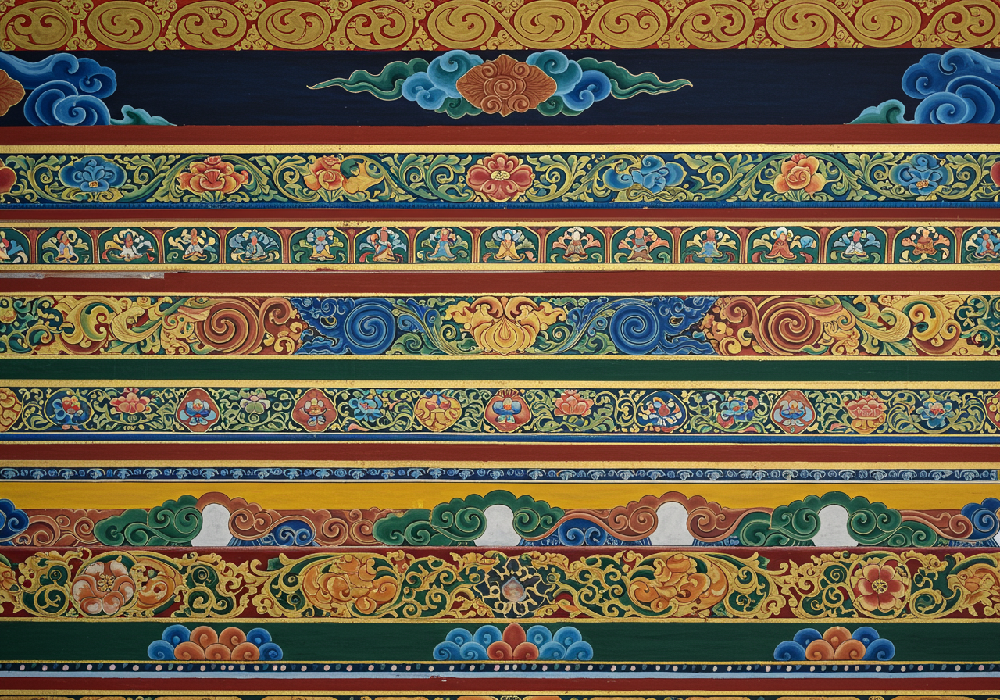

Abstract geometric repeating patterns in the style of thangka paintings. Intricate linework, vibrant colors including reds, blues, greens, yellows, and gold. Use of symmetry and geometric shapes like circles, squares, triangles, and spirals. Layered patterns creating depth and complexity. Inspired by traditional Tibetan art motifs but with an abstract, non-representational focus. No figures, deities, or recognizable objects. Repeating elements should be stylized and geometric. High detail and crisp, clean lines. Aim for patterns suitable for horizontal beam decoration.


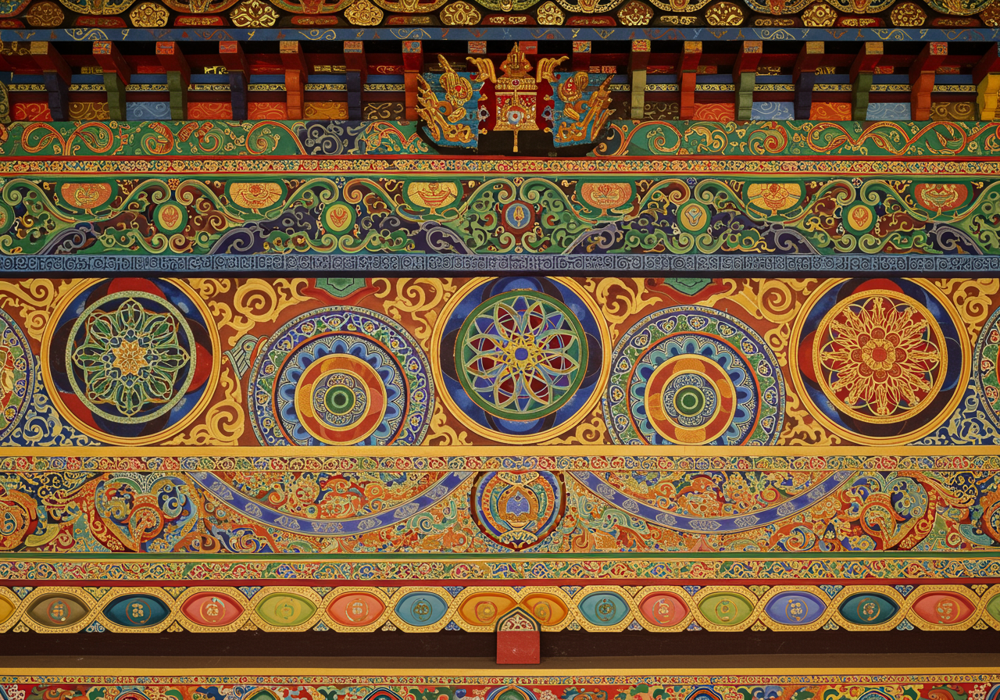

Abstract geometric patterns in the style of Thangka paintings. Repeating designs featuring interlocking shapes, stylized cloud motifs, and geometric floral elements. Symmetrical compositions with bold outlines and vibrant colors: reds, blues, greens, yellows, and gold accents. Intricate details inspired by traditional Tibetan art, emphasizing balance and harmony. No identifiable figures or objects, only abstract ornamentation. The patterns should have a sense of depth and texture, mimicking the layered appearance of Thangka paintings. The design should have a quality of traditional buddhist murals, but remain completely abstract.


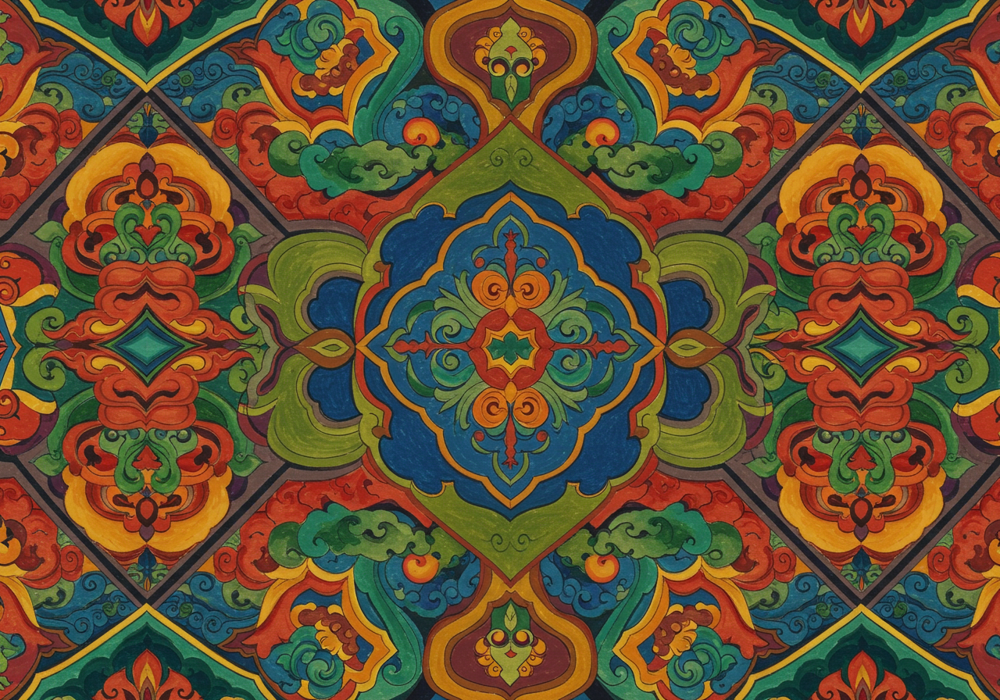

In [ ]:
import io
from PIL import Image
from IPython.display import display, Markdown

for n in range(5):
  prompt = get_image_prompt(prompt_generation_prompt, image_files)

  display(Markdown(prompt))

  result = generate_images(prompt)

  img = Image.open(io.BytesIO(result.generated_images[0].image.image_bytes))
  display(img)

  img.save(f'design-{n:03d}.png')


Zip the images files together so it's easy to download them all.

In [ ]:
!zip -r images.zip *.png

  adding: design-000.png (deflated 0%)
  adding: design-001.png (deflated 0%)
  adding: design-002.png (deflated 0%)
  adding: design-003.png (deflated 0%)
  adding: design-004.png (deflated 0%)


# Next Steps

Now that you have the ability to generate beautiful designs, have fun and go make art!

### Useful documentation references:

To improve your prompting skills, check the [prompt guide](https://ai.google.dev/gemini-api/docs/imagen-prompt-guide) for great advices on creating your prompts.

### Related examples

If you're curious about cool things you can build with Imagen, check those great examples:
* [Zoom on earth](../examples/Zoom_on_earth.ipynb): Another take on mixing Gemini and Imagen, this time using [function calling](../quickstarts/Function_calling.ipynb) to communicate.
* [Book Illustration](../examples/Book_illustration.ipynb): This time you use multiple Gemini features (long context, multimodality, structured output, file API, chat mode...) in conjunction with the Imagen 3 model to illustrate a book

### Continue your discovery of the Gemini API

Gemini is not only good at generating images, but also at understanding them. Check the [Spatial understanding](../quickstarts/Spatial_understanding.ipynb) guide for an introduction on those capabilities, and the [Video understanding](../quickstarts/Video_understanding.ipynb) one for video examples.

You should also have a look at the [Live API](../quickstarts/Get_started_LiveAPI.ipynb) to create live intereactions with the models.